In [1]:
import cv2 
import numpy as np
from numpy import uint8
import matplotlib.pyplot as plt
from colorthief import ColorThief
from sklearn.cluster import KMeans
from skimage.measure import label, regionprops

In [2]:
# Importing image 
image = cv2.imread("vns.png")

# Converting the image in GRAY scale and HSV
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

cv2.imshow("Window", image)

k = cv2.waitKey(0)
if k == 27:         # wait for ESC key to exit
    cv2.destroyAllWindows()

### Functions

In [3]:
# Function to give the Dominant colors
def Dominant_colors(image, n):
    colors = []
    # Load image with ColorThief
    ct = ColorThief(image)
    # Dominant color and 2nd 
    dom_color = ct.get_color(quality=1)
    palets = ct.get_palette(color_count = n)
    colors = palets
    plt.imshow([[palet for palet in palets]])
    plt.show()
    print([[dom_color]], colors)
    return dom_color

# Function to extract the main colors of the image
def main_colors(image, n):

    if image is None:
        print("Error: Image not found or could not be read.")
        return None
    # RGB image
    image_cv2_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # resizing the image  for better and easier kmean
    x =image_cv2_rgb.reshape(-1, 3)
    # initialise KMeans
    kmeans = KMeans(n_clusters=n, n_init=10)
    # Reducing the clusters 
    kmeans.fit(x)
    
    # Get the cluster centers representing dominant colors
    dominant_colors = kmeans.cluster_centers_ 
    # Obtained image 
    seg_image = kmeans.cluster_centers_[kmeans.labels_]
    seg_image = (seg_image.reshape(image_cv2_rgb.shape)/255)
    return seg_image, dominant_colors.astype(np.uint8)


# Function to perform OPENING on an image multiplle times 
def Opening(image, kernel, n):
    # For loop to do multiple Openings
    for i in range(0, n):
        # Closing on the dark parts of the image
        image = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
    return image

# Function to perform OPENING on an image multiplle times 
def Closing(image, kernel, n):
    # For loop to do multiple Openings
    for i in range(0, n):
        # Closing on the dark parts of the image
        image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    return image


# Filtering the HSV image
def filter(hsv, color):
    # Define range for target color
    lower = np.array([color[0]-10, 100, 100])
    upper = np.array([color[0]+10, 255, 255])
    # Create mask for pixels in color range
    mask = cv2.inRange(hsv, lower, upper)
    # Set pixels to white if in color range, black otherwise
    res = np.zeros_like(hsv)
    res[mask>0] = [255, 255, 255]  
    res[mask==0] = [0, 0, 0]
    # return the resulting image
    return res 


# Function to remove a channel
def remove_channel(image, channel):
  image = Image.fromarray(image)
  # Remove a channel
  for x in range(image.size[0]):
     for y in range(image.size[1]):
        r, g, b = image.getpixel((x,y))
        if channel == 'r':
            image.putpixel((x, y), (0, g, b))
        elif channel == 'g':
            image.putpixel((x, y), (r, 0, b))
        elif channel == 'b':
            image.putpixel((x, y), (r, g, 0)) 
        else:
            print("channels are : 'r','g','b'")   
  # return the immage      
  return image

# Negative of the image
def convert_to_negative(img):
    # getting number of pixels in the image
    pixel_h, pixel_v = img.shape[0], img.shape[1]

    # converting each pixel's color to its negative
    for i in range(pixel_h):
        for j in range(pixel_v):
            img[i][j] = [255, 255, 255] - img[i][j]

    return img

### First Method

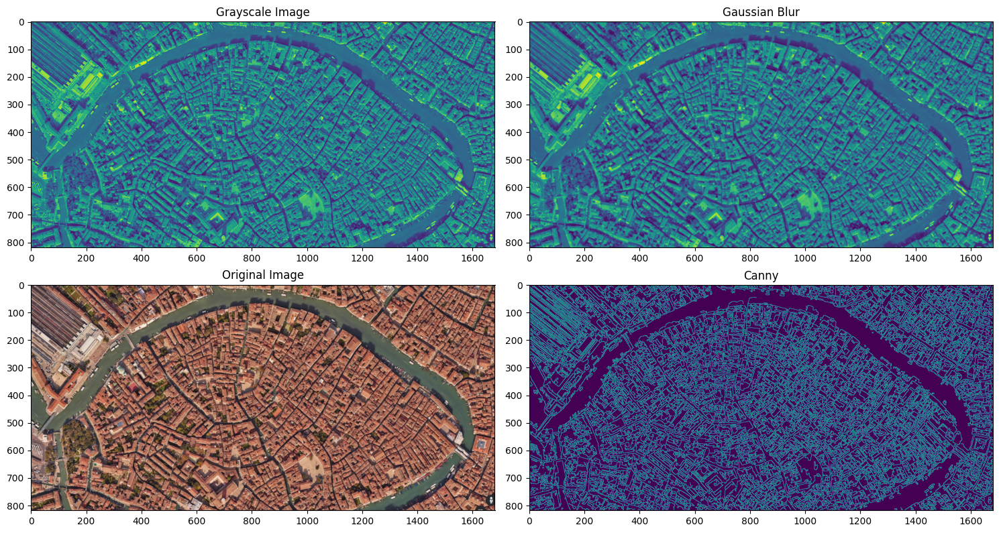

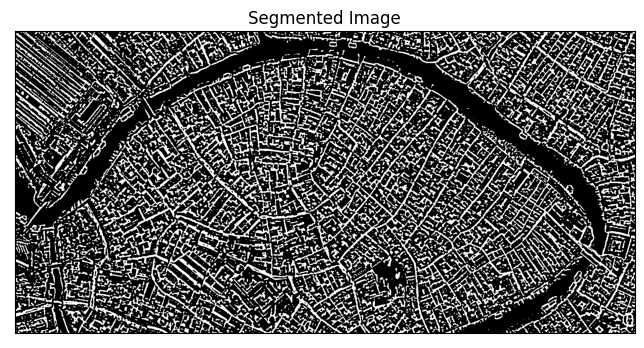

In [4]:
# Apply Gaussian blur
blurred_image = cv2.GaussianBlur(gray, (5, 5), 0)

# Edge detection using Canny
#edges = cv2.Canny(blurred_image, 50, 150)
edges = cv2.Canny(blurred_image, 10, 200)

# Display the images
# Figure
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 8))
axs[0, 0].imshow(gray)
axs[0, 0].set_title('Grayscale Image')  # Set title for the first image subplot
axs[1, 0].imshow(rgb)
axs[1, 0].set_title('Original Image')  # Set title for the second image subplot
axs[0, 1].imshow(blurred_image)
axs[0, 1].set_title('Gaussian Blur')
axs[1, 1].imshow(edges)
axs[1, 1].set_title('Canny')

plt.tight_layout()  # Adjust layout for better display
plt.show()  # Show the plot

# Now we will perform segmentation to isolate the waterways.
# We assume that the waterways are darker than the surroundings, so we use thresholding.
# Adaptive thresholding to segment the waterways
# The parameters blockSize and C need to be tuned to your specific image conditions

block_size = 11
C = 10

segmented_image = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                        cv2.THRESH_BINARY_INV, block_size, C)


# Display the segmented image
plt.figure(figsize=(8, 8))
plt.imshow(segmented_image, cmap='gray')
plt.title('Segmented Image'), plt.xticks([]), plt.yticks([])
plt.show()

# Save the edge-detected and segmented images
#cv2.imwrite('Edges.png', edges)
#cv2.imwrite('Segmented_image.png', segmented_image)


Number of bridge candidates: 5


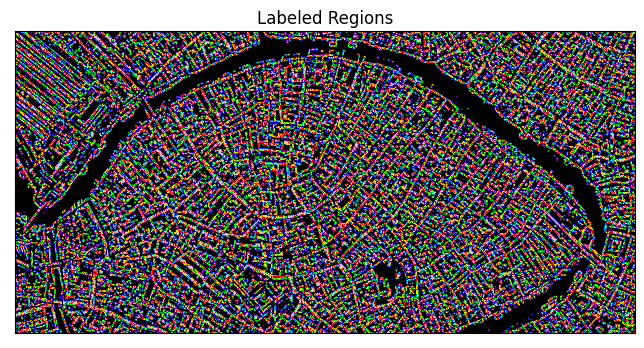

In [5]:
# Kernel
kernel = np.ones((7,7), np.uint8)

# Perform morphological closing to connect components that might be bridges
closing = cv2.morphologyEx(segmented_image, cv2.MORPH_CLOSE, kernel)

# Label different regions after closing
label_img = label(closing)

# Properties of labeled regions
regions = regionprops(label_img)

# Filter regions based on geometric properties
# We are looking for relatively narrow and elongated regions that could be bridges
bridge_candidates = []
for region in regions:
    # Calculate the aspect ratio of the bounding box of the region
    minr, minc, maxr, maxc = region.bbox
    width = maxc - minc
    height = maxr - minr
    aspect_ratio = width / height if width < height else height / width

    # Check if the region is elongated and narrow enough to be a bridge
    # The aspect_ratio threshold needs to be set based on the expected bridge dimensions
    # The area threshold excludes too small or too large regions
    if aspect_ratio > 0.1 and 100 < region.area < 10000:
        bridge_candidates.append(region)
        bridges = cv2.rectangle(segmented_image, (minc, minr), (maxc, maxr), (0, 0, 255), 2)  # Draw a green rectangle

# Print the number of bridge candidates
print(f"Number of bridge candidates: {len(bridge_candidates)}")
# Show the image with labeled bridge candidates
plt.figure(figsize=(8, 8))
plt.imshow(segmented_image, cmap='nipy_spectral')
plt.title('Labeled Regions'), plt.xticks([]), plt.yticks([])
plt.show()

In [6]:
cv2.imshow("Window", bridges)

k = cv2.waitKey(0)
if k == 27:         # wait for ESC key to exit
    cv2.destroyAllWindows()

#cv2.imwrite('Blur.png', blurred_image)

### another trial

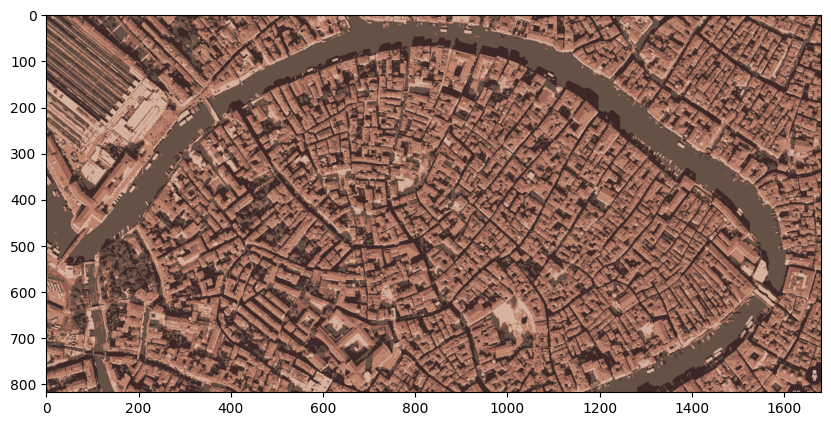

float64
[155 100  84] [61 40 39] [101  81  70] [190 133 110]


In [7]:
main_colors_image, dominant_colors = main_colors(image, 5)

plt.figure(figsize=(10, 10))
plt.imshow(main_colors_image)
plt.show()

print(main_colors_image.dtype)
print(dominant_colors[0], dominant_colors[1], dominant_colors[2], dominant_colors[4])

In [8]:
# Transform to be able to use it in CV2
main_colors_image = (main_colors_image*255).astype(np.uint8)
# Gray, Hsv and BGR
main_colors_gray = cv2.cvtColor(main_colors_image, cv2.COLOR_RGB2GRAY)
main_colors_hsv = cv2.cvtColor(main_colors_image, cv2.COLOR_RGB2HSV) 

print(main_colors_image.dtype)
print(dominant_colors)

uint8
[[155 100  84]
 [ 61  40  39]
 [101  81  70]
 [213 179 159]
 [190 133 110]]


### Second Method

#### this

#### THIS

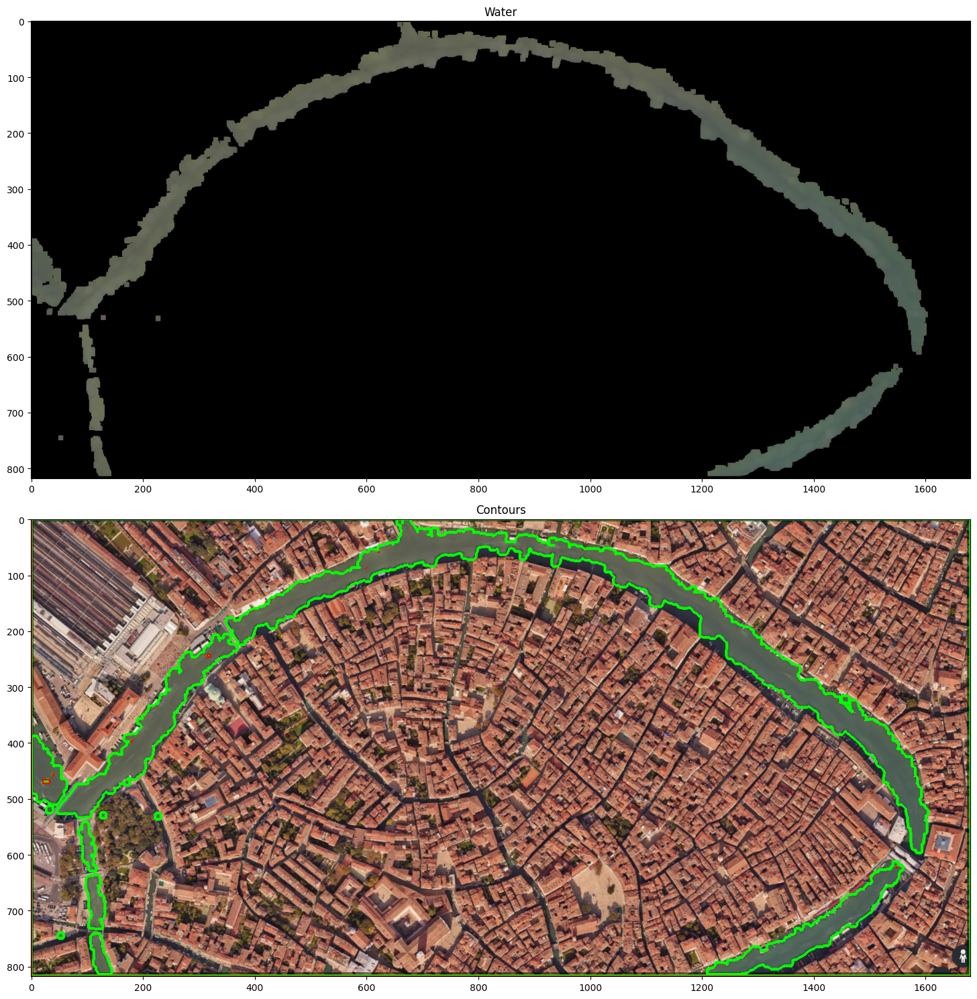

In [9]:
# Kernel
kernel = np.ones((3,3), np.uint8)
# Get rgb dimensions
height, width = image.shape[:2]

# Change every 5 border pixels to black to facilitate contours drawing
for i in range(height):
    for j in range(width):
        if i < 5 or i > height - 8 or j < 5 or j > width - 8:
            if (i + j) % 2 == 0:
                image[i, j] = [0, 0, 0]  # Set the pixel to black

# Redraw the RGB
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#525E55 = rgb(82,94,85) ..
#5F6656 = rgb(95,102,86) ..

# Masks to remove the buildings, water and trees  
mask_water = cv2.inRange(rgb, (75, 90, 80), (112, 120, 105)) # remove water 
mask_build = cv2.inRange(rgb, (53, 36, 37), (196, 142, 119)) # take buildings

# apply mask to image
mask_not_w = cv2.bitwise_not(mask_water)
mask_not_b = cv2.bitwise_not(mask_build)

mask_and_wb = cv2.bitwise_and(mask_water, mask_build)
mask_not_wb = cv2.bitwise_and(mask_not_b, mask_not_w)

result_water = cv2.bitwise_and(rgb, rgb, mask=mask_water)

# Morphology for cleaning image
result_closing = Closing(result_water, kernel, 5)
result_opening = Opening(result_water, kernel, 5)
# Dilatation of the opening
result_dilatation = cv2.dilate(result_opening,kernel,iterations=3)

result_water_gray = cv2.cvtColor(result_dilatation, cv2.COLOR_RGB2GRAY)

# Otsu's thresholding
ret, thres = cv2.threshold(result_water_gray,127, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)  

# Find contours on threshold image 
contours, hierarchy = cv2.findContours(thres, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on original image
cv2.drawContours(rgb, contours, -1, (0,255,0), 3)  
                 
# Label different regions after closing
label_img = label(thres)

# Properties of labeled regions
regions = regionprops(label_img)

areas = []
boxes = []
# Accessing properties for each labeled region
for region in regions:
    # Accessing some properties for demonstration
    area = region.area
    bbox = region.bbox
    centroid = region.centroid
    boxes.append(bbox)
    areas.append(area)

    if area != 0:
        # Print or use these properties as needed
        #print(f"Area: {area}, Bounding Box: {bbox}, Centroid: {centroid}")
        cv2.rectangle( rgb, (bbox[1], bbox[0]), (bbox[3], bbox[2]), (255, 0, 0), 2)

# Figure
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 15))
# Display images in subplots
axs[0].imshow(result_dilatation)
axs[0].set_title('Water')  # Set title for the first image subplot

axs[1].imshow(rgb)
axs[1].set_title('Contours')  # Set title for the second image subplot

plt.tight_layout()  # Adjust layout for better display
plt.show()  # Show the plot

### that

Contour 1 area: 1372560.0
Contour 1 perimeter: 4994.0
Contour 2 area: 1657.5
Contour 2 perimeter: 205.15432798862457
Contour 4 area: 2360.0
Contour 4 perimeter: 269.7401144504547
Contour 5 area: 14496.0
Contour 5 perimeter: 1034.9259667396545
Contour 7 area: 1547.0
Contour 7 perimeter: 246.42640602588654
Contour 11 area: 5010.0
Contour 11 perimeter: 354.3675309419632
Contour 15 area: 19396.0
Contour 15 perimeter: 1323.6366444826126
Contour 19 area: 66012.0
Contour 19 perimeter: 4202.934316158295
Bounding box of contour 1: (x=0, y=0, width=1681, height=818)
Contour 1: Most left point - (0, 0), Most right point - (1680, 817)
Bounding box of contour 2: (x=106, y=741, width=39, height=74)
Contour 2: Most left point - (106, 760), Most right point - (144, 805)
Bounding box of contour 3: (x=98, y=636, width=35, height=98)
Contour 3: Most left point - (98, 661), Most right point - (132, 686)
Bounding box of contour 4: (x=1209, y=612, width=351, height=203)
Contour 4: Most left point - (1209, 8

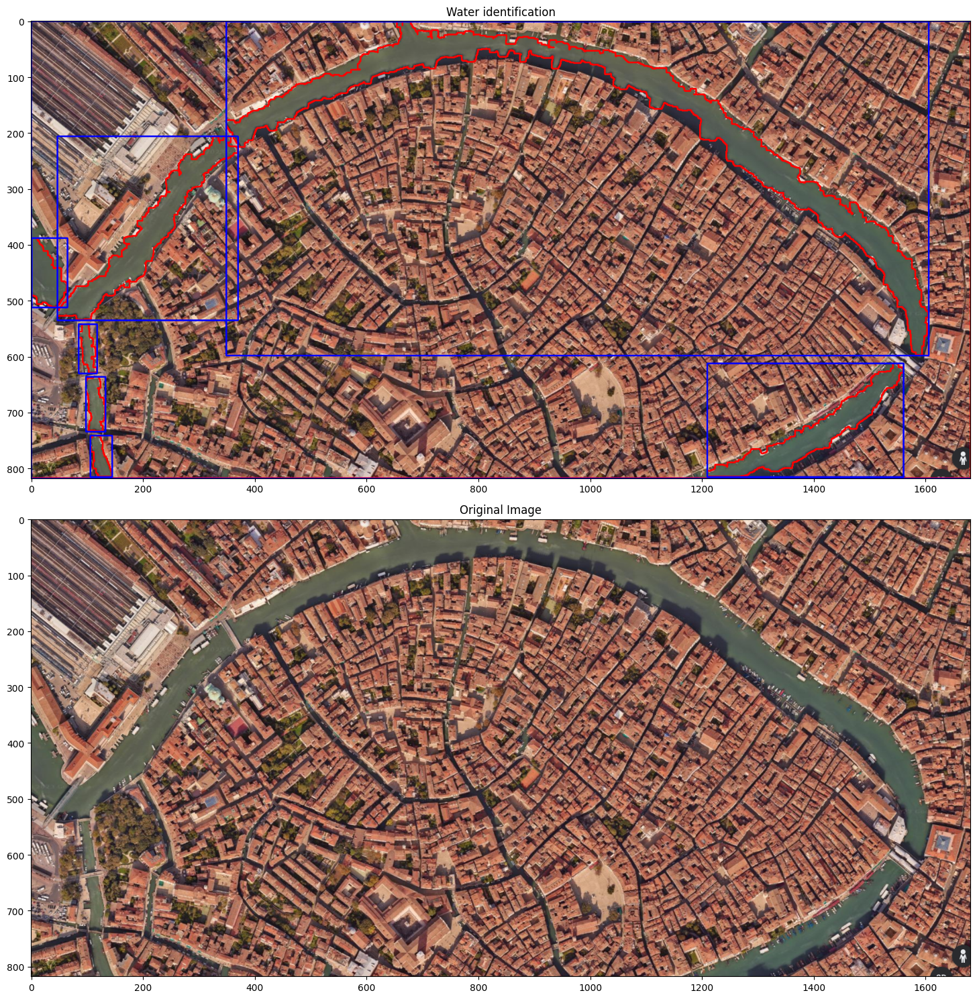

In [10]:
# Importing image 
image = cv2.imread("vns.png")
# Redraw the RGB
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Contours that are big enough to be water
main_contours = []

# Iterate through the contours and calculate perimeters and areas
for i, cnt in enumerate(contours):

    perimeter = cv2.arcLength(cnt, True)  # Calculate the perimeter of the contour
    area = cv2.contourArea(cnt)

    if area > 200:
        main_contours.append(cnt)
        # Draw the contours on the image (optional)
        area_rgb =cv2.drawContours(rgb, [cnt], -1, (0, 0, 255), 2)
        print(f"Contour {i + 1} area: {area}")

        if perimeter > 50 :
            cv2.drawContours(rgb, [cnt], -1, (255, 0, 0), 2)
            print(f"Contour {i + 1} perimeter: {perimeter}")

# Potential bridges points
bridges_points = []

# Iterate through the contours to find the most left and most right points on each contour
for i, cnt in enumerate(main_contours):
    most_left_point = None
    most_right_point = None
    
    x, y, w, h = cv2.boundingRect(cnt)
    print(f"Bounding box of contour {i + 1}: (x={x}, y={y}, width={w}, height={h})")
    # Draw the bounding rectangle on the image
    rect_rgb = cv2.rectangle(rgb, (x, y), (x + w, y + h), (0, 0, 255), 2)
    # Find the most left and most right points within the current contour
    for point in cnt:
        x, y = point[0]  # Extract x and y coordinates of the point

        # Check for the most left point
        if most_left_point is None or x < most_left_point[0]:
            most_left_point = (x, y)

        # Check for the most right point
        if most_right_point is None or x > most_right_point[0]:
            most_right_point = (x, y)
    
    bridges_points.append((most_left_point,most_right_point))
    # Print the coordinates of the most left and most right points on the current contour
    print(f"Contour {i + 1}: Most left point - {most_left_point}, Most right point - {most_right_point}")

# Figure
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 15))
# Display images in subplots
axs[0].imshow(rect_rgb)
axs[0].set_title('Water identification')  # Set title for the first image subplot
# Redraw the RGB
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
axs[1].imshow(rgb)
axs[1].set_title('Original Image')  # Set title for the second image subplot

plt.tight_layout()  # Adjust layout for better display
plt.show()  # Show the plot

In [11]:
bridges_points_real = bridges_points[1:]
print(bridges_points_real)
print(len(bridges_points_real))

[((106, 760), (144, 805)), ((98, 661), (132, 686)), ((1209, 813), (1559, 620)), ((85, 565), (117, 620)), ((1, 389), (64, 469)), ((47, 526), (369, 227)), ((349, 187), (1604, 520))]
7


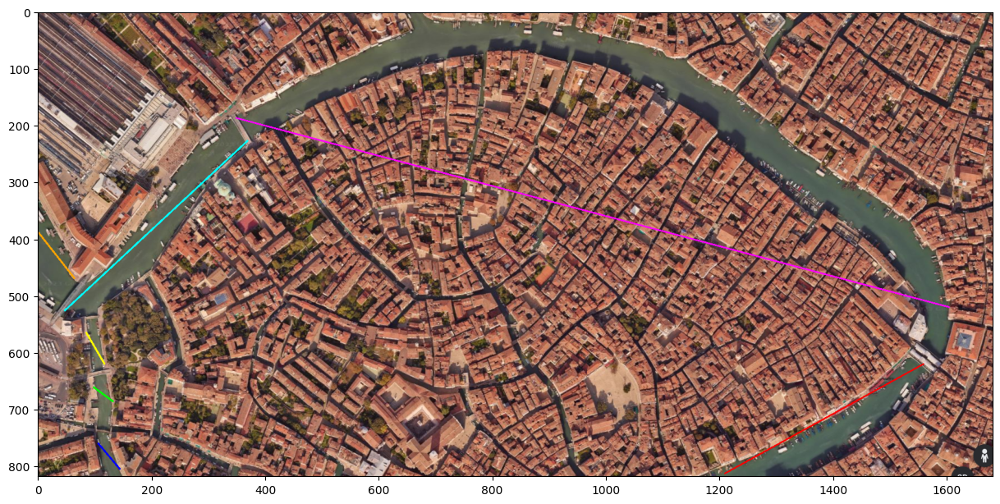

In [12]:
# Importing image 
image = cv2.imread("vns.png")
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define colors in RGB format: Blue, Green, Red, Yellow, Orange, cyan and magenta
colors = [(0, 0, 255), (0, 255, 0), (255, 0, 0), (255, 255, 0), (255, 165, 0), (0, 255, 255), (255, 0, 255)]

# Draw lines between points on the image
for i, point_pair in enumerate(bridges_points_real):
    
    pt1, pt2 = point_pair
    pt1 = tuple(map(int, pt1))
    pt2 = tuple(map(int, pt2))
    
    # Use a different color for each line
    color = colors[i]
    im_pt = cv2.line(rgb, pt1, pt2, color, 2)

# Display the image with lines between points
plt.figure(figsize=(15, 15))
plt.imshow(im_pt)
plt.show()

##### Blue, Green, Red, Yellow, Orange, cyan and magenta

hint: (1left-2right ; 2left-4right; 4left-6left; 5right-6left; 6right-7left; 7right-3right) 

therw are 6 bridges present at coordinates [((106, 760), (132, 686)), ((98, 661), (117, 620)), ((85, 565), (47, 526)), ((64, 469), (47, 526)), ((369, 227), (349, 187)), ((1604, 520), (1559, 620))]


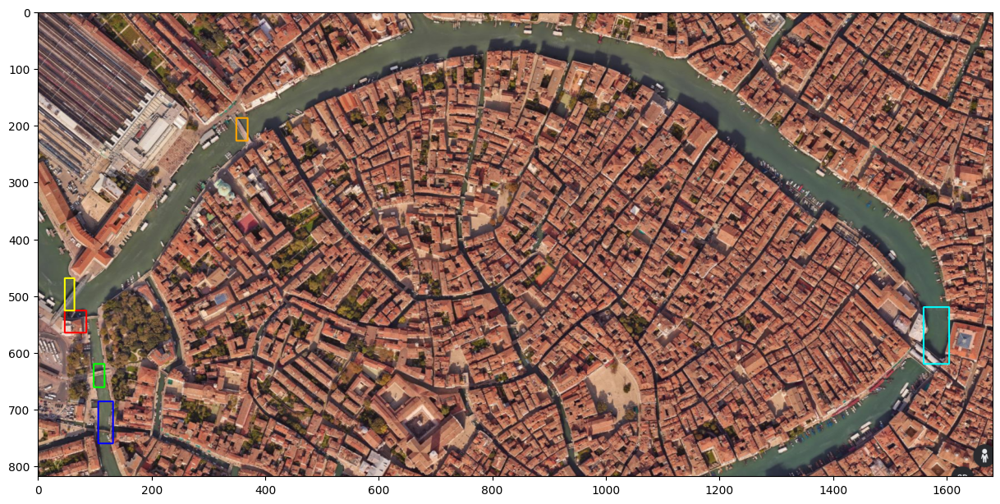

In [13]:
# Importing image 
image = cv2.imread("vns.png")
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define the pairs of points for drawing lines
bridges_points_ends =[
((106, 760), (132, 686)),
((98, 661), (117, 620)),
((85, 565), (47, 526)),
((64, 469), (47, 526)),
((369, 227), (349, 187)),
((1604, 520), (1559, 620))]

# Define colors in RGB format: Blue, Green, Red, Yellow, Orange, cyan and magenta
colors = [(0, 0, 255), (0, 255, 0), (255, 0, 0), (255, 255, 0), (255, 165, 0), (0, 255, 255), (255, 0, 255)]

for i, point_pair in enumerate(bridges_points_ends):
    
    pt1, pt2 = point_pair
    pt1 = tuple(map(int, pt1))
    pt2 = tuple(map(int, pt2))
    
    # Use a different color for each line
    color = colors[i]
    final = cv2.rectangle(rgb, pt1, pt2, color, 2)

print(f'therw are {len(bridges_points_ends)} bridges present at coordinates {bridges_points_ends}')
# Display the image with lines between points
plt.figure(figsize=(15, 15))
plt.imshow(final)
plt.show()


### see

In [281]:
original_rgb = rgb.copy()  # Create a copy of the original rgb

# Sort contours based on area (optional step)
sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)

# Create a blank canvas to draw the contours and connect them
canvas = np.zeros_like(rgb)

# Draw contours on the canvas
cv2.drawContours(canvas, sorted_contours, -1, (255, 255, 255), thickness=cv2.FILLED)

# Get rgb dimensions
height, width = rgb.shape[:2]

# Iterate through contours and connect them if they reach the rgb edges
for i in range(len(sorted_contours) - 1):
    cnt1 = sorted_contours[i]
    cnt2 = sorted_contours[i + 1]

    # Find the closest points on contours
    closest_point_cnt1 = tuple(cnt1[cnt1[:, :, 0].argmin()][0])
    closest_point_cnt2 = tuple(cnt2[cnt2[:, :, 0].argmin()][0])

    # If the closest points are at the rgb edges, draw a line between them
    if closest_point_cnt1[0] <= 0 or closest_point_cnt1[0] >= width or \
       closest_point_cnt1[1] <= 0 or closest_point_cnt1[1] >= height or \
       closest_point_cnt2[0] <= 0 or closest_point_cnt2[0] >= width or \
       closest_point_cnt2[1] <= 0 or closest_point_cnt2[1] >= height:
        
        cv2.line(canvas, closest_point_cnt1, closest_point_cnt2, (255, 255, 255), 2)

# Combine the original rgb with the contour lines
result = cv2.addWeighted(original_rgb, 1, canvas, 0.5, 0)
'''
main_contours = []

# Iterate through the contours and calculate perimeters and areas
for i, cnt in enumerate(contours):

    perimeter = cv2.arcLength(cnt, True)  # Calculate the perimeter of the contour
    area = cv2.contourArea(cnt)

    if area > 100:
        main_contours.append(cnt)
        # Draw the contours on the image (optional)
        area_rgb =cv2.drawContours(rgb, [cnt], -1, (0, 0, 255), 2)
        print(f"Contour {i + 1} area: {area}")

        if perimeter > 50 :
            cv2.drawContours(rgb, [cnt], -1, (255, 0, 0), 2)
            print(f"Contour {i + 1} perimeter: {perimeter}")
'''
# Display the result
cv2.imshow('Contours with Connections', result)
cv2.waitKey(0)
cv2.destroyAllWindows()
